<a href="https://colab.research.google.com/github/lybarra/itba-tp-final-cnn/blob/main/Trabajo_Final_YBARRA_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Style Transfer

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

La idea de este trabajo final es reproducir el siguiente paper:

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta. 

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

# En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma.

# Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes.

Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

In [1]:
# Imagen para estilo
!wget https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg

# Imagen para contenido
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output

--2021-01-27 22:39:22--  https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘La_noche_estrellada1.jpg’

La_noche_estrellada 100%[===================>] 218.48K  --.-KB/s    in 0.006s  

2021-01-27 22:39:22 (34.6 MB/s) - ‘La_noche_estrellada1.jpg’ saved [223725/223725]

--2021-01-27 22:39:22--  https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 153015 (149K) [ima

In [2]:
from keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.applications import vgg19
from keras import backend as K
from pathlib import Path
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
# %tensorflow_version 1.x

Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida

base_image_path = Path("/content/775px-Neckarfront_Tübingen_Mai_2017.jpg")
style_reference_image_path = Path("/content/La_noche_estrellada1.jpg")
result_prefix = Path("/content/output")
iterations = 100

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

**Respuesta**:

*total_variation_weigth*: 
```
Es el peso que pondera la total_variation_loss explicada más adelante. 
Mientras más pqueño es este número, va a haber menos variaciones bruzcas de un "pixel" a otro.
Eso se puede ver por la presencia de pequeños puntos en las imágenes del pto 8
en la medida que se aumenta el valor del peso.
Adicionalmente, da el efecto de una imagen con menos nitidez.
```
*style_weight*: 
```
Corresponde al parámetro β definido en el paper. Es el peso que pondera la style_loss. 
Mientras más grande sea este valor, hay una mayor componente de features complejas 
(perteneciente a la imagen de estilo) en la combinada.
Como se puede ver en el pto 8, aumenta la presencia de texturas y formas 
de la imagen de estilo en la combinada.
```
*content_weight*: 
```
Corresponde al parámetro α definido en el paper. Es el peso que pondera la content_loss. 
El comportamiento es similar al del style_weight,
pero para la imagen de contenido.
```




In [4]:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [5]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

Respuesta:
```
En las primeras dos lineas se carga la imagen y se transforma un Numpy Array.
Con el parámetro target_size se ajusta al tamaño deseado
utilizando el método "nearest" (por default) para ajustar la imagen.

La 3ra linea agregar una dimensión para procesar la imagen de entrada como de batch_size=1.

La 4ta linea asegura que la imagen de entrada respete el mismo formato 
que el dataset con el que fue entrenada la VGG19.

Convierte de RGB a GBR y, le resta la media por canal a la representación de cada pixel 
(la media por canal del dataset 'ImageNet' con el que fue entrenado la VGG19).
Por lo cual ahora la representación puede tener números negativos. 
Esta linea es importante ya que se cargan filtros pre-entrenados con ImagNet, 
y con ellos se realizaran operaciones matriciales, 
por lo que, para que las operaciones tengan sentido,
es fundamental realizar este preprocesamiento.
Estas operaciones tienen que ver con la estrategia que ausmieron para 
disminuir el tiempo de entrenamiento y aumentar el accuracy al entrenar la red.
```

In [6]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

Respuesta:
```
En esta celda se realiza el proceso inverso, es decir, 
se le suma la media por canal y se convierte de BGR a RGB. 

Luego con la última linea se asegura que los valores esten contenidos entre 0 y 255 (con clip) y 
con formato unit8 (8 bit int) que corresponde a valores enteros sin signo entre 0 y 255.
```



In [7]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [8]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

In [9]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

In [10]:
# Aclaración:
# La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

In [11]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

80142336/80134624 [==============================] - 1s 0us/step
Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram?¿Para qué se usa?


```
La matriz de Gram es el resultado del producto punto entre todos los mapas de características (aplanados) de una capa.

Tiene dimensión (canales, canales).

Se utiliza para extraer el estilo de una imagen, 
con ella se computa la función de costo (para el estilo).

El prodcuto punto entre dos vectores da una idea de similitud entre dos vectores,
entonces, la estrategia aca es capturar la similitud entre todos los mapas de capacterísticas,
independientemente de la información espacial.

Por ese motivo se raliza un flatten de las matrices, lo que se intenta es capturar las texturas, colores, etc.

```

- ¿Por qué se permutan las dimensiones de x?

```
Se permutan para traer la dimensión "canales" como primer dimensión del tensor,
ya que todas las operaciones se realizan a nivel de canal 
(el flatten, la transposición y, finalmente, el producto punto).
```

In [12]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses: Explicar qué mide cada una de las losses en las siguientes tres celdas.


**Respuesta**:

*style_loss*:
```
Calcula la loss de estilo para una determinada capa, 
computando el MSE entre la Matriz de Gram del mapa de características de la imagen de estilo
y la Matriz de Gram del mapa de características de la imagen sintetizada (la combinación).

Como la matriz de Gram se calcula como un producto punto solamente,
hay que dividir por Nl^2xMl^2 para obtener la media.
```
*content_loss*:
```
Calcula la suma de la diferencia cuadrática entre el mapa de características de la imagen de contenido, 
y el mapa de características de la imagen combinada.

En este caso, la idea es capturar las características espaciales que activan la ultima capa de salida,
dado que los patrones que se lograr capturar en esta capa son los más complejos,
es decir que son los que conforman "geometricamente" a la imagen.
```
*total_variation_loss*:
```
Calcula la diferencia entre cada elemento (pixel) de la imagen y su vecino a nivel de fila y columna.

El efecto de esta componente es regularizante, de forma de controlar, de alguna manera, 
los cambios bruscos dentro de la imagen.
```

In [13]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [14]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


In [15]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


In [16]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

In [17]:
grads = K.gradients(loss, combination_image)


outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

# 6) Explique el propósito de las siguientes tres celdas. 
```
La función eval_loss_and_grads devuelve la loss y los gradientes para una "x" de entrada.

Todo el código a nivel de backend de Keras escrito en las celdas previas
se resume instanciando la funcion f_outputs que es la que va a devolver la loss,
dado el placeholder "combination_image".

La utilización de la clase Evaluator está muy bien explicada en los comentarios de la celda.
```
**¿Qué hace la función fmin_l_bfgs_b?** 
```
BFGS es un algoritmo de optimización no lineal que encuentra el mínimo de una función dado su gradiente.

Al no requerir el Hessiano (matriz de segundas derivadas), entra en el grupo de los métodos "quasi-Newton".
Para cada iteración, el algoritmo estima el Hessiano calculando el cambio en el gradiente.
Como resultado se obtiene una tasa de convergencia muy lineal.

Adicionalmente, el algoritmo L-BFGS-B permite limitar la cantidad de memoria que utiliza la computadora.

Por lo tanto, lo que hace fmin_l_bfgs_b es encontrar el mínimo de una función (la loss), dado su gradiente,
aplicando el algoritmo explicado anteriormente.
```
**¿En qué se diferencia con la implementación del paper?** 
```
Como primer diferencia sutil, la total_variation_loss no esta implementada en el paper,
solamente utilizan las otras dos componentes (o por lo menos son las que se mencionan).

En la cuestion del entrenamiento, el paper utiliza otra estrategia;
como lo que se esta modificando son los píxeles de la imagen (a pesos de la CNN fijos),
se calcula la loss de las imagenes (de estilo y contenido) 
contrastando con una  imagen de ruido blanco (que es la que se va modificando en cada iteración).

Con esa Loss ponderada por α y β, y algun algoritmo de Gradient Descent,
se estiman los gradientes y se modifica la imagen "base".

De tal forma que la imagen de ruido blanco (inicialmente) termina capturando el estilo y el contenido.
```
**¿Se puede utilizar alguna alternativa?**
```
Siendo un problema de una complejidad baja, es decir,
el tamaño de la imagen es relativamente pequeño, y es una sola imagen combinada,
tal vez podría probarse con algun algoritmo de convergencia más rápida (polinómica),
que consuma mayores recursos pero que mejore la velocidad.

Es el famoso balance entre costo computacional y tiempo pretendido.

Adicionalmente, dado que no se están entrenando los parámetros de la red, 
y ayudándome con la gráfica de la Loss vs Iteraciones (realizada mas adelante),
puedo intuir que el espacio de la Loss no tienen mínimos locales,
por lo que utilizaría algún algoritmo sin inercia, y que me permita comenzar
con un LR "grande" e ir disminuyendolo fuertemente en cada iteración.

Por último también agregaría un EarlyStopping, dado que, como se verá mas adelante,
tal vez no eran necesarias tantas iteraciones.
```

In [18]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values


In [19]:
# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

In [20]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)
min_vals = []
for i in range(iterations):
    
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=5) #20
    
    min_vals.append(min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Iteration', i,' - Current loss value:', min_val,' - ', round(end_time-start_time,2),'seg' )
    # print('Image saved as', fname)
    # print('Iteration %d completed in %ds' % (i, end_time - start_time))



Iteration 0  - Current loss value: 317727500000.0  -  10.37 seg
Iteration 1  - Current loss value: 273251010000.0  -  1.79 seg
Iteration 2  - Current loss value: 236904970000.0  -  1.77 seg
Iteration 3  - Current loss value: 206797930000.0  -  1.78 seg
Iteration 4  - Current loss value: 181568770000.0  -  1.78 seg
Iteration 5  - Current loss value: 160299400000.0  -  1.79 seg
Iteration 6  - Current loss value: 142215580000.0  -  1.79 seg
Iteration 7  - Current loss value: 126756590000.0  -  1.79 seg
Iteration 8  - Current loss value: 113483874000.0  -  1.8 seg
Iteration 9  - Current loss value: 101998700000.0  -  1.81 seg
Iteration 10  - Current loss value: 91969340000.0  -  1.81 seg
Iteration 11  - Current loss value: 83151766000.0  -  1.82 seg
Iteration 12  - Current loss value: 75350500000.0  -  1.84 seg
Iteration 13  - Current loss value: 68411540000.0  -  1.82 seg
Iteration 14  - Current loss value: 62220304000.0  -  1.84 seg
Iteration 15  - Current loss value: 56685175000.0  -  1

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:1458: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ext != 'png':


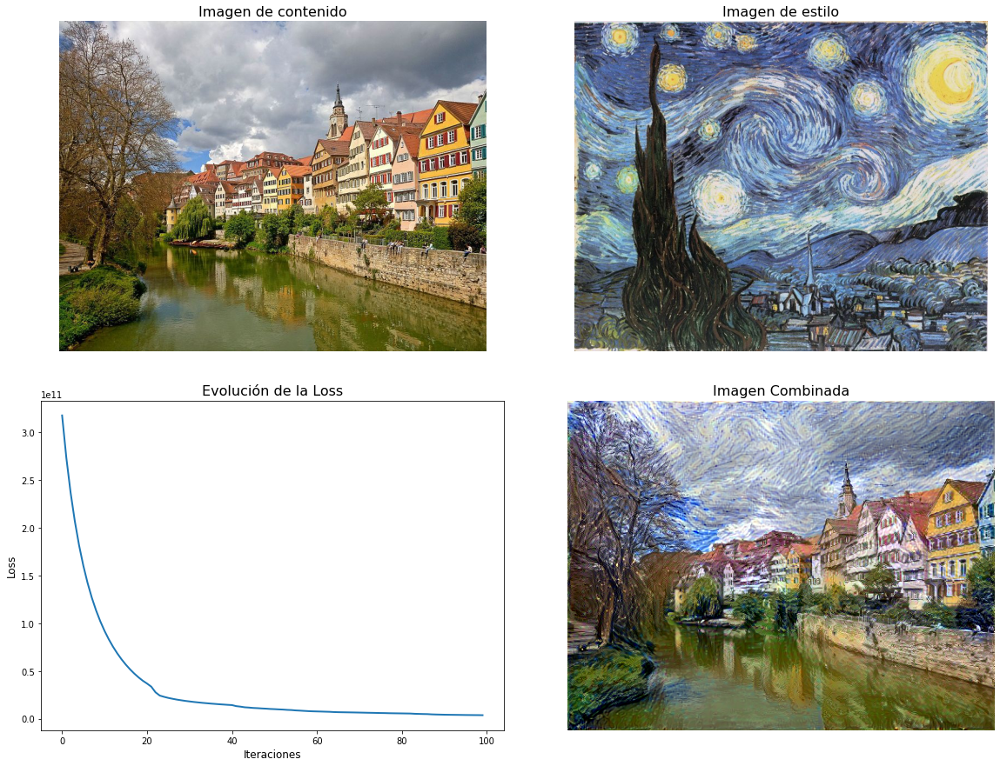

In [21]:
fig, ([ax11, ax12], [ax21, ax22]) = plt.subplots(2, 2, figsize=(20,15))
fig.subplots_adjust(wspace=0.1, hspace=0.15)

ax11.imshow(plt.imread(base_image_path, img))
ax11.set_title('Imagen de contenido', fontsize=16)
ax11.axis('off')

ax12.imshow(plt.imread(style_reference_image_path, img))
ax12.set_title('Imagen de estilo', fontsize=16)
ax12.axis('off')

ax21.plot(range(0, iterations), min_vals, lw=2)
ax21.set_ylabel('Loss', fontsize=12)
ax21.set_xlabel('Iteraciones', fontsize=12)
ax21.set_title('Evolución de la Loss', fontsize=16)

image = plt.imread(fname, img)
ax22.imshow(image)
ax22.set_title('Imagen Combinada', fontsize=16)
ax22.axis('off')

plt.show()

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias. (Adjuntar las imágenes generadas como archivos separados.)

Respuesta:

```
La descripción se detalló en el punto 1.
La explicación para lo sucedido es simplemente el aporte a la loss total.
```

In [22]:
from itertools import product

total_variation_weights = [0.01, 0.1, 1] #0.1
style_weights = [1, 10, 100] #10
content_weights = [0.1, 1, 10] #1

combs = list(product(*[total_variation_weights, style_weights,content_weights]))

print(len(combs))
# print(comb)


27


In [23]:
iterations = 60

!mkdir /content/output_r8

result_prefix = Path("/content/output_r8")


In [24]:
start_time = time.time()

for nro, weight in enumerate(combs):
  total_variation_weight = weight[0]
  style_weight = weight[1]
  content_weight = weight[2]
  print('Procesando imagen:',nro+1,' de ',len(combs))

  # Definimos el tamaño de las imágenes a utilizar
  width, height = load_img(base_image_path).size
  img_nrows = 400
  img_ncols = int(width * img_nrows / height)

  # get tensor representations of our images
  # K.variable convierte un numpy array en un tensor, para 
  base_image = K.variable(preprocess_image(base_image_path))
  style_reference_image = K.variable(preprocess_image(style_reference_image_path))
  combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

  # combine the 3 images into a single Keras tensor
  input_tensor = K.concatenate([base_image,
                                style_reference_image,
                                combination_image], axis=0)

  # build the VGG19 network with our 3 images as input
  # the model will be loaded with pre-trained ImageNet weights
  model = vgg19.VGG19(input_tensor=input_tensor,
                      weights='imagenet', include_top=False)
  
  # print('Model loaded.')

  # get the symbolic outputs of each "key" layer (we gave them unique names).
  outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
      
  # Total Loss
  loss = K.variable(0.0)
  layer_features = outputs_dict['block5_conv2']
  base_image_features = layer_features[0, :, :, :]
  combination_features = layer_features[2, :, :, :]
  loss = loss + content_weight * content_loss(base_image_features,
                                              combination_features)

  feature_layers = ['block1_conv1', 'block2_conv1',
                    'block3_conv1', 'block4_conv1',
                    'block5_conv1']
  for layer_name in feature_layers:
      layer_features = outputs_dict[layer_name]
      style_reference_features = layer_features[1, :, :, :] 
      combination_features = layer_features[2, :, :, :]
      sl = style_loss(style_reference_features, combination_features)
      loss = loss + (style_weight / len(feature_layers)) * sl

  loss = loss + total_variation_weight * total_variation_loss(combination_image)

  grads = K.gradients(loss, combination_image)

  outputs = [loss]
  if isinstance(grads, (list, tuple)):
      outputs += grads
  else:
      outputs.append(grads)

  f_outputs = K.function([combination_image], outputs)

  evaluator = Evaluator()

  x = preprocess_image(base_image_path)
      
  # run scipy-based optimization (L-BFGS) over the pixels of the generated image
  # so as to minimize the neural style loss

  for i in range(iterations):

      
      x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                      fprime=evaluator.grads, maxfun=15) #20
      # print('Start of iteration', i,' - Current loss value:', min_val)
      # save current generated image
      img = deprocess_image(x.copy())
      if i==iterations-1:
        fname = result_prefix / (str(weight[0])+'_'+str(weight[1])+'_'+str(weight[2])+'.png')
        save_img(fname, img)
      
      
      # print('Image saved as', fname)
      # print('Iteration %d completed in %ds' % (i, end_time - start_time))
  print('Terminado')

end_time = time.time()
print('Proceso terminado en %ds' % (end_time - start_time))

Procesando imagen: 1  de  27
Terminado
Procesando imagen: 2  de  27
Terminado
Procesando imagen: 3  de  27
Terminado
Procesando imagen: 4  de  27
Terminado
Procesando imagen: 5  de  27
Terminado
Procesando imagen: 6  de  27
Terminado
Procesando imagen: 7  de  27
Terminado
Procesando imagen: 8  de  27
Terminado
Procesando imagen: 9  de  27
Terminado
Procesando imagen: 10  de  27
Terminado
Procesando imagen: 11  de  27
Terminado
Procesando imagen: 12  de  27
Terminado
Procesando imagen: 13  de  27
Terminado
Procesando imagen: 14  de  27
Terminado
Procesando imagen: 15  de  27
Terminado
Procesando imagen: 16  de  27
Terminado
Procesando imagen: 17  de  27
Terminado
Procesando imagen: 18  de  27
Terminado
Procesando imagen: 19  de  27
Terminado
Procesando imagen: 20  de  27
Terminado
Procesando imagen: 21  de  27
Terminado
Procesando imagen: 22  de  27
Terminado
Procesando imagen: 23  de  27
Terminado
Procesando imagen: 24  de  27
Terminado
Procesando imagen: 25  de  27
Terminado
Procesand

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:1458: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ext != 'png':


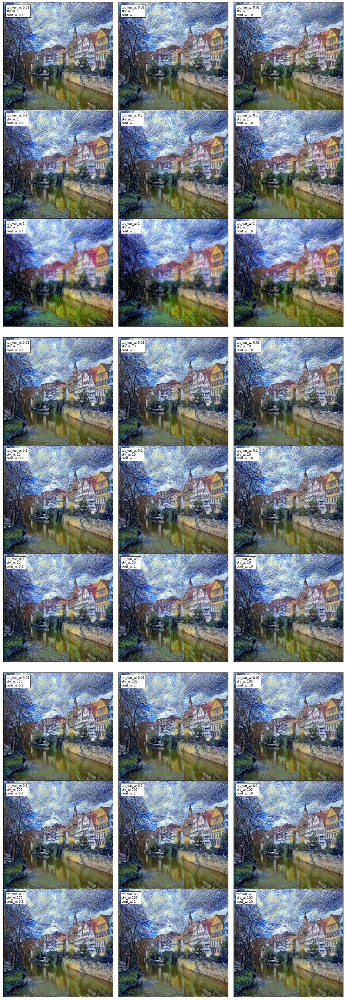

In [25]:
fig_width = 20

fig11 = plt.figure(figsize=(fig_width,fig_width*3 ), constrained_layout=False)

# gridspec inside gridspec
outer_grid = fig11.add_gridspec(3, 3, wspace=0.05, hspace=0.1/3)

for i in range(9):

    inner_grid = outer_grid[i].subgridspec(3, 1, wspace=0.01, hspace=0.0)
    
    for j in range(3):
        idx=(9*j)+i
        comb=combs[idx]

        fname = result_prefix / (str(comb[0])+'_'+str(comb[1])+'_'+str(comb[2])+'.png')
        image = plt.imread(fname, img)

        ax = fig11.add_subplot(inner_grid[j])
        ax.imshow(image, aspect='auto')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.text(15, 50, 'tot_var_w: '+ str(comb[0])+'\nsty_w: ' + str(comb[1])+'\ncont_w: ' + str(comb[2]), bbox={'facecolor': 'white', 'pad': 3})
        fig11.add_subplot(ax)

plt.show()

# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

In [26]:
!mkdir /content/output_r9


#Imagen de estilo
!wget https://hgtvhome.sndimg.com/content/dam/images/hgtv/fullset/2010/8/11/2/TS-78365701_pile-of-pickles_s3x4.jpg.rend.hgtvcom.616.822.suffix/1400948851006.jpeg

--2021-01-28 00:51:01--  https://hgtvhome.sndimg.com/content/dam/images/hgtv/fullset/2010/8/11/2/TS-78365701_pile-of-pickles_s3x4.jpg.rend.hgtvcom.616.822.suffix/1400948851006.jpeg
Resolving hgtvhome.sndimg.com (hgtvhome.sndimg.com)... 184.28.88.110
Connecting to hgtvhome.sndimg.com (hgtvhome.sndimg.com)|184.28.88.110|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90233 (88K) [image/jpeg]
Saving to: ‘1400948851006.jpeg’

1400948851006.jpeg  100%[===================>]  88.12K  --.-KB/s    in 0.004s  

2021-01-28 00:51:01 (19.2 MB/s) - ‘1400948851006.jpeg’ saved [90233/90233]



<img src="https://hgtvhome.sndimg.com/content/dam/images/hgtv/fullset/2010/8/11/2/TS-78365701_pile-of-pickles_s3x4.jpg.rend.hgtvcom.616.822.suffix/1400948851006.jpeg" height="100">

In [27]:
#Imagen de contenido
!wget https://pbs.twimg.com/profile_images/1319285013096005646/zFgPUw6v_400x400.jpg

--2021-01-28 00:51:01--  https://pbs.twimg.com/profile_images/1319285013096005646/zFgPUw6v_400x400.jpg
Resolving pbs.twimg.com (pbs.twimg.com)... 192.229.173.16, 2606:2800:220:13d:2176:94a:948:148e
Connecting to pbs.twimg.com (pbs.twimg.com)|192.229.173.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22731 (22K) [image/jpeg]
Saving to: ‘zFgPUw6v_400x400.jpg’

zFgPUw6v_400x400.jp 100%[===================>]  22.20K  --.-KB/s    in 0s      

2021-01-28 00:51:01 (239 MB/s) - ‘zFgPUw6v_400x400.jpg’ saved [22731/22731]




<img src="https://pbs.twimg.com/profile_images/1319285013096005646/zFgPUw6v_400x400.jpg" height="100">

In [28]:
# REDEFINO las imagenes que vamos a utilizar, y el directorio de salida

base_image_path = Path("/content/zFgPUw6v_400x400.jpg")
style_reference_image_path = Path("/content/1400948851006.jpeg")
result_prefix = Path("/content/output_r9")

total_variation_weight = 0.1 #0.1
style_weight = 20 #10
content_weight = 0.1 #1

iterations = 80

In [29]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
    
# Total Loss
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl

loss = loss + total_variation_weight * total_variation_loss(combination_image)

grads = K.gradients(loss, combination_image)

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

evaluator = Evaluator()

x = preprocess_image(base_image_path)
    
# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
min_vals=[]
for i in range(iterations):

    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun = 20) #20
    min_vals.append(min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    if i==iterations-1:
      fname = result_prefix / ('output_at_iteration_%d.png' % i)
      save_img(fname, img)
    end_time = time.time()
    print('Iteration', i,' - Current loss value:', min_val,' - ', round(end_time-start_time,2),'seg' )
    # print('Image saved as', fname)
    # print('Iteration %d completed in %ds' % (i, end_time - start_time))

Model loaded.
Iteration 0  - Current loss value: 50228273000.0  -  8.52 seg
Iteration 1  - Current loss value: 19986326000.0  -  4.89 seg
Iteration 2  - Current loss value: 13600745000.0  -  4.91 seg
Iteration 3  - Current loss value: 10528524000.0  -  4.99 seg
Iteration 4  - Current loss value: 8784282000.0  -  5.03 seg
Iteration 5  - Current loss value: 7598416400.0  -  5.23 seg
Iteration 6  - Current loss value: 6702245400.0  -  5.06 seg
Iteration 7  - Current loss value: 5964227600.0  -  5.02 seg
Iteration 8  - Current loss value: 5399838700.0  -  5.01 seg
Iteration 9  - Current loss value: 4894335000.0  -  4.96 seg
Iteration 10  - Current loss value: 4477648400.0  -  4.88 seg
Iteration 11  - Current loss value: 4136803800.0  -  4.93 seg
Iteration 12  - Current loss value: 3831525400.0  -  4.9 seg
Iteration 13  - Current loss value: 3607531300.0  -  4.84 seg
Iteration 14  - Current loss value: 3366221800.0  -  4.97 seg
Iteration 15  - Current loss value: 3161049000.0  -  4.92 seg
I

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:1458: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ext != 'png':


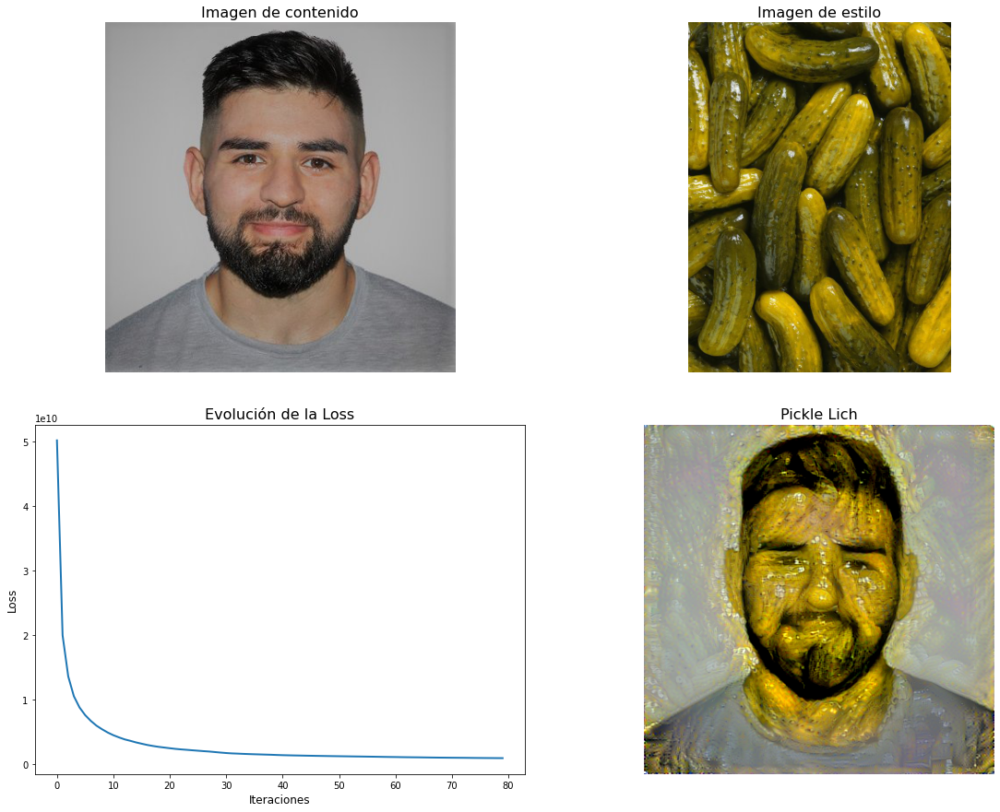

In [30]:
fig, ([ax11, ax12], [ax21, ax22]) = plt.subplots(2, 2, figsize=(20,15))
fig.subplots_adjust(wspace=0.1, hspace=0.15)

ax11.imshow(plt.imread(base_image_path, img))
ax11.set_title('Imagen de contenido', fontsize=16)
ax11.axis('off')

ax12.imshow(plt.imread(style_reference_image_path, img))
ax12.set_title('Imagen de estilo', fontsize=16)
ax12.axis('off')

ax21.plot(range(0, iterations), min_vals, lw=2)
ax21.set_ylabel('Loss', fontsize=12)
ax21.set_xlabel('Iteraciones', fontsize=12)
ax21.set_title('Evolución de la Loss', fontsize=16)

image = plt.imread(fname, img)
ax22.imshow(image)
ax22.set_title('Pickle Lich', fontsize=16)
ax22.axis('off')

plt.show()